# Assignment 5: Segmentation

### Samantha Handal - 260983914

##1 - K-Means and Mean-Shift Clustering for Segmentation

In [ ]:
import cv2
from google.colab import drive
drive.mount('/content/drive')

# path variable to my image library
path = '/content/drive/My Drive/ECSE415/Assignment_5/'

Mounted at /content/drive


### 1.1 - Haar Filters for computing image features

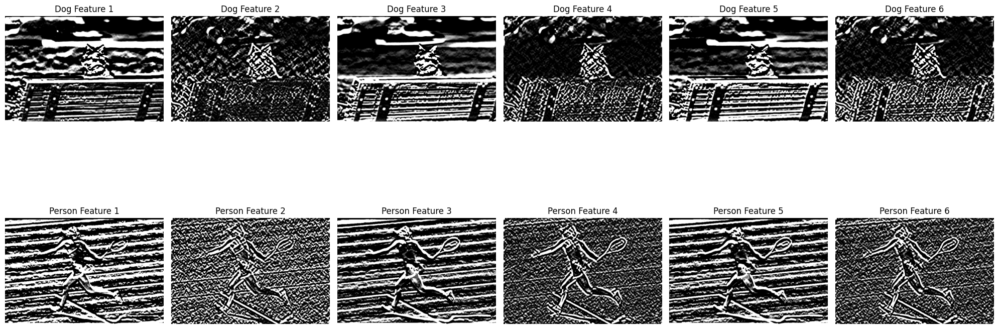

In [30]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# The Haar filters will capture edge-like features in the image by highlighting areas of rapid
# intensity change. For each color channel, a feature map that represents these changes is produced.
def apply_haar_filter_to_channel(channel, kernel):
    """
    Apply a Haar filter to a single color channel of an image.

    channel: Single color channel of an image
    kernel: Haar filter kernel
    return: The resulting feature image after applying the Haar filter
    """

    # Default constant border value seems to be 0 - https://theailearner.com/tag/cv2-filter2d/
    filtered_channel = cv2.filter2D(channel, -1, kernel, borderType=cv2.BORDER_CONSTANT)
    return filtered_channel

# Defining the Haar filter kernels
# For a 12x6 rectangle, the kernel has a +1 weight on the top half and -1 on the bottom half
haar_kernel_1 = np.ones((12, 6), dtype=np.float32)
haar_kernel_1[6:, :] = -1.0   # Bottom half is -1

# For a 12x12 square, the kernel has a +1 weight on the top-left and bottom-right quarters and -1 on the other two quarters
haar_kernel_2 = np.ones((12, 12), dtype=np.float32)
haar_kernel_2[:6, 6:] = -1.0  # Top-right quadrant is -1
haar_kernel_2[6:, :6] = -1.0  # Bottom-left quadrant is -1

# Reading images 'Dog.jpg' and 'Person.jpg' as RBG
img_dog = cv2.imread(path + 'Part 1/Dog.jpg', cv2.COLOR_BGR2RGB)
img_person = cv2.imread(path + 'Part 1/Person.jpg', cv2.COLOR_BGR2RGB)

# Splitting the images into their Red, Green, and Blue channels
channels_dog = cv2.split(img_dog)
channels_person = cv2.split(img_person)

# Apply each Haar filter to each color channel
features_dog = [apply_haar_filter_to_channel(channel, kernel) for channel in channels_dog for kernel in [haar_kernel_1, haar_kernel_2]]
features_person = [apply_haar_filter_to_channel(channel, kernel) for channel in channels_person for kernel in [haar_kernel_1, haar_kernel_2]]

# Plot all 12 images: 6 features from the dog and 6 from the person
plt.figure(figsize=(20, 10))
for i, feature_image in enumerate(features_dog + features_person, 1):
    plt.subplot(2, 6, i)
    plt.imshow(feature_image, cmap='gray')
    title = 'Dog Feature' if i <= 6 else 'Person Feature'
    plt.title(f"{title} {i}" if i <= 6 else f"{title} {i-6}")
    plt.axis('off')

plt.tight_layout()
plt.show()

### 1.2 - Implement the K-means clustering

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


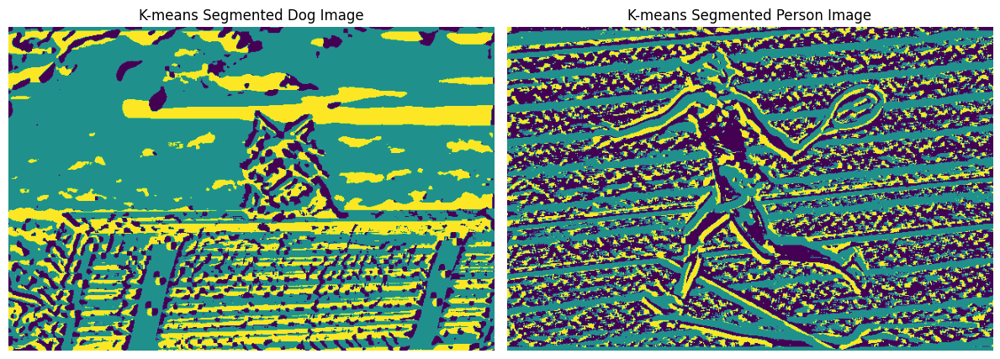

In [31]:
from sklearn.cluster import KMeans

# Function to reshape the feature list into a 2D array for K-means
def prepare_features_for_kmeans(features):

    # Stack all feature images into a single numpy array where each pixel is a feature vector
    feature_array = np.stack(features, axis=-1)

    # Reshape the feature array into a 2D array (num_pixels, num_features)
    num_pixels = feature_array.shape[0] * feature_array.shape[1]
    feature_vector = feature_array.reshape(num_pixels, -1)
    return feature_vector

# Prepare the feature vectors for K-means
feature_vector_dog = prepare_features_for_kmeans(features_dog)
feature_vector_person = prepare_features_for_kmeans(features_person)

# Perform K-means clustering
kmeans_dog = KMeans(n_clusters=3, random_state=42).fit(feature_vector_dog)
kmeans_person = KMeans(n_clusters=3, random_state=42).fit(feature_vector_person)

# Reshape the labels to the original image shape
labels_dog = kmeans_dog.labels_.reshape(img_dog.shape[:2])
labels_person = kmeans_person.labels_.reshape(img_person.shape[:2])

# Visualize the segmented images
plt.figure(figsize=(12, 6))

# Dog image segmentation
plt.subplot(1, 2, 1)
plt.imshow(labels_dog)
plt.title('K-means Segmented Dog Image')
plt.axis('off')

# Person image segmentation
plt.subplot(1, 2, 2)
plt.imshow(labels_person)
plt.title('K-means Segmented Person Image')
plt.axis('off')

plt.tight_layout()
plt.show()

### 1.3 - Implement the Mean-shift clustering

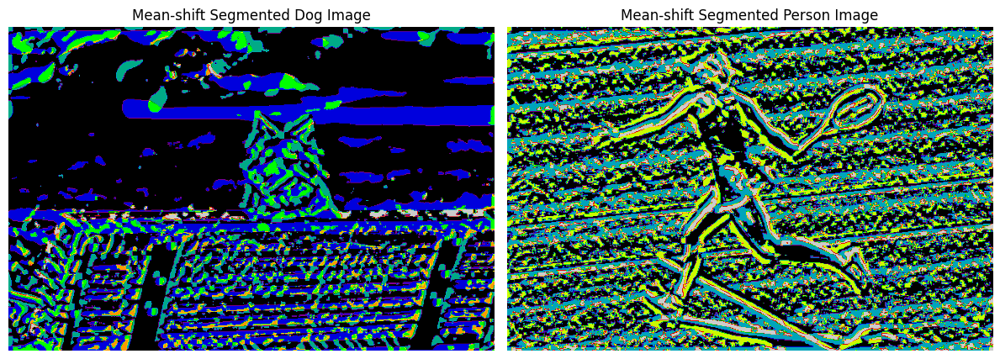

In [32]:
from sklearn.cluster import MeanShift, estimate_bandwidth

# Function to perform Mean-shift clustering on the features
def mean_shift_clustering(features, quantile=0.2, n_samples=500):
    # Estimate the bandwidth of the input data (can be manually set if known for better results)
    bandwidth = estimate_bandwidth(features, quantile=quantile, n_samples=n_samples)

    # Apply Mean-shift clustering
    ms = MeanShift(bandwidth=bandwidth, bin_seeding=True)
    ms.fit(features)

    # Get labels and cluster centers
    labels = ms.labels_
    cluster_centers = ms.cluster_centers_

    return labels, cluster_centers

# Stack the binary mask features into a 2D array where each pixel is a feature vector
features_dog_ms = np.stack(features_dog, axis=2).reshape(-1, 6)
features_person_ms = np.stack(features_person, axis=2).reshape(-1, 6)

# Perform Mean-shift clustering
labels_dog_ms, cluster_centers_dog = mean_shift_clustering(features_dog_ms)
labels_person_ms, cluster_centers_person = mean_shift_clustering(features_person_ms)

# Reshape the labels to the original image shape for visualization
labels_dog_ms = labels_dog_ms.reshape(img_dog.shape[:2])
labels_person_ms = labels_person_ms.reshape(img_person.shape[:2])

# Visualize the segmented images
plt.figure(figsize=(12, 6))

# Dog image segmentation
plt.subplot(1, 2, 1)
plt.imshow(labels_dog_ms, cmap='nipy_spectral')
plt.title('Mean-shift Segmented Dog Image')
plt.axis('off')

# Person image segmentation
plt.subplot(1, 2, 2)
plt.imshow(labels_person_ms, cmap='nipy_spectral')
plt.title('Mean-shift Segmented Person Image')
plt.axis('off')

plt.tight_layout()
plt.show()

### 1.4 - Discuss the benefits and limitations of these clustering methods for image segmentation.

K-means is best used when you have a good estimate of the number of segments and the segments are roughly equal in size and data points in each cluster are roughly equidistant from the cluster's center. However, it may not perform well on complex images with segments that vary a lot in size, shape, or color intensity.

Mean Shift, on the other hand, excels in identifying segments that have more natural shapes and vary in size due to its density-based approach. It's particularly useful when the number of segments is unknown. However, its computational requirements can be limiting for large images and high-dimensional
features, and choosing the right bandwidth can be challenging without domain knowledge or additional parameter tuning techniques.

Sources: https://www.geeksforgeeks.org/image-segmentation-using-k-means-clustering/, https://www.kdnuggets.com/2019/08/introduction-image-segmentation-k-means-clustering.html, https://www.ipb.uni-bonn.de/html/teaching/photo12-2021/2021-pho1-12-segmentation.pptx.pdf, https://stackoverflow.com/questions/4831813/image-segmentation-using-mean-shift-explained

##2 - Neural Network Implementation for Image Segmentation

### 2.1 - Implement the pre-trained MaskR-CNN and YOLOv8n

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


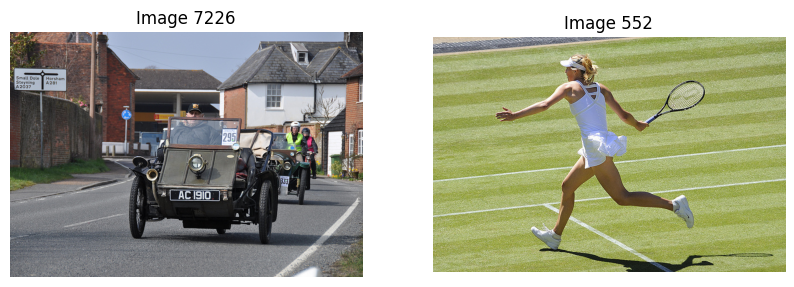

In [27]:
import cv2
import matplotlib.pyplot as plt
from google.colab import drive
drive.mount('/content/drive')

# path variable to my image library
path = '/content/drive/My Drive/ECSE415/Assignment_5/'

# Path to images '000000007226.jpg' and '000000000552.jpg'
path_7226 = path + 'Part 2/000000007226.jpg'
path_552 = path + 'Part 2/000000000552.jpg'

img_7226 = cv2.imread(path_7226)
img_7226 = cv2.cvtColor(img_7226, cv2.COLOR_BGR2RGB)

img_552 = cv2.imread(path_552)
img_552 = cv2.cvtColor(img_552, cv2.COLOR_BGR2RGB)

# Visualize
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(img_7226)
plt.title('Image 7226')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(img_552)
plt.title('Image 552')
plt.axis('off')

plt.show()

img_552 = cv2.cvtColor(img_552, cv2.COLOR_BGR2RGB)
img_7226 = cv2.cvtColor(img_7226, cv2.COLOR_BGR2RGB)

#### MaskR-CNN
Using updated version of Mask R-CNN from the Detectron repo:

https://github.com/facebookresearch/detectron2?tab=readme-ov-file

followed [this tutorial](https://colab.research.google.com/drive/16jcaJoc6bCFAQ96jDe2HwtXj7BMD_-m5#scrollTo=8IRGo8d0qkgR) for setup

##### Install detectron2

In [5]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities (e.g. compiled operators).
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

# Properly install detectron2. (Please do not install twice in both ways)
# !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 6.3 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
Cloning into 'detectron2'...
remote: Enumerating objects: 15526, done.
remote: Counting objects: 100% (251/251), done.
remote: Compressing objects: 100% (197/197), done.
remote: Total 15526 (delta 80), reused 194 (delta 54), pack-reused 15275
Receiving objects: 100% (15526/15526), 6.40 MiB | 6.54 MiB/s, done.
Resolving deltas: 100% (11195/11195), done.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 3.1 MB/s eta 0:00:0

In [6]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0
torch:  2.2 ; cuda:  cu121
detectron2: 0.6


In [7]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

##### 2.2 - Run a pre-trained detectron2 model

In [11]:
cfg = get_cfg()
# add project-specific config (e.g., TensorMask) here if you're not running a model in detectron2's core library
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
# Find a model from detectron2's model zoo. You can use the https://dl.fbaipublicfiles... url as well
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")

[03/28 16:11:24 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl ...


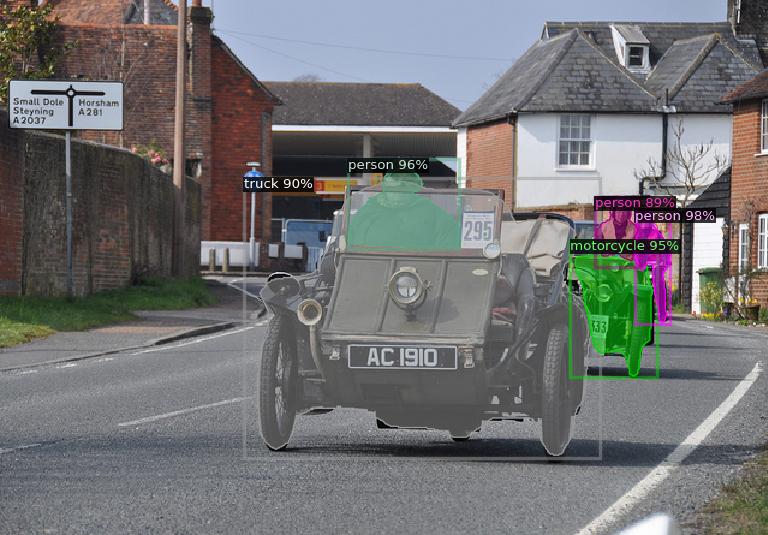

[03/28 16:11:25 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl ...


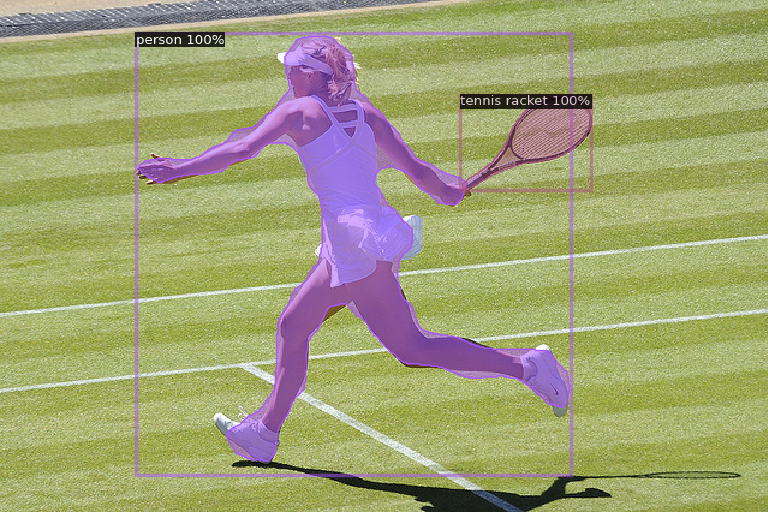

In [28]:
# Function to process and visualize predictions on an image
def process_image(img, cfg):

    # Make prediction
    predictor = DefaultPredictor(cfg)
    outputs = predictor(img)

    # Visualize the predictions
    v = Visualizer(img[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

# Process each image
process_image(img_7226, cfg)
process_image(img_552, cfg)

#### YOLOv8n-seg

##### Setup YOLOv8-seg

In [16]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 723.1/723.1 kB 13.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 61.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 62.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 89.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 1.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 13.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 MB 29.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.2/124.2 MB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.0/196.0 MB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 166.0/166.0 MB 6.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.1/99.1 kB 13.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━

In [17]:
from ultralytics import YOLO

# load a pretrained model (recommended for training)
model = YOLO("yolov8n-seg.pt")

100%|██████████| 6.73M/6.73M [00:01<00:00, 4.57MB/s]


##### 2.2 - Run a pre-trained YOLOv8-seg model


0: 448x640 3 persons, 2 motorcycles, 1 truck, 12.2ms
Speed: 2.9ms preprocess, 12.2ms inference, 3.7ms postprocess per image at shape (1, 3, 448, 640)


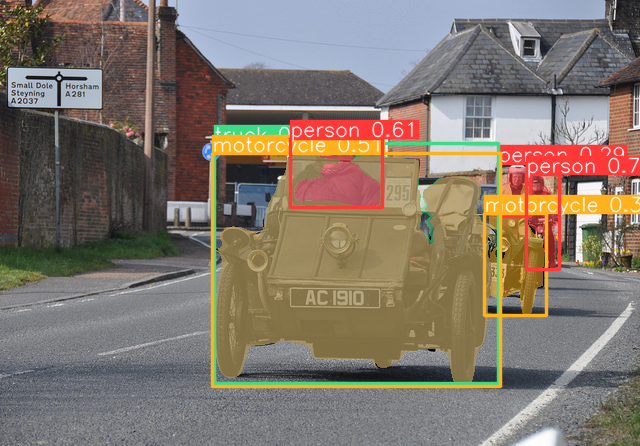


0: 448x640 1 person, 1 tennis racket, 10.3ms
Speed: 1.8ms preprocess, 10.3ms inference, 2.1ms postprocess per image at shape (1, 3, 448, 640)


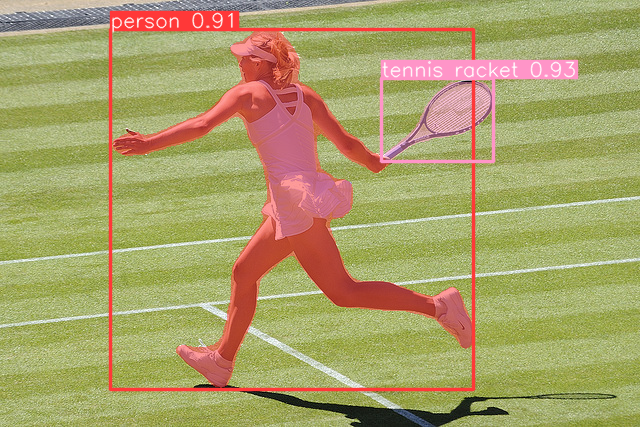

In [29]:
from PIL import Image
import cv2
from google.colab.patches import cv2_imshow

for image in [img_7226, img_552]:

    # Run the model
    results = model(image)

    for r in results:
        im_array = r.plot()  # plot a BGR numpy array of predictions
        img = Image.fromarray(im_array[..., ::-1])  # RGB PIL image
        img = cv2.cvtColor(im_array[..., ::-1], cv2.COLOR_BGR2RGB) # Open-CV reads images as BGR, we convert it to RGB
        cv2_imshow(img)

### 2.3 - Repeat for an image of a Montreal street scene

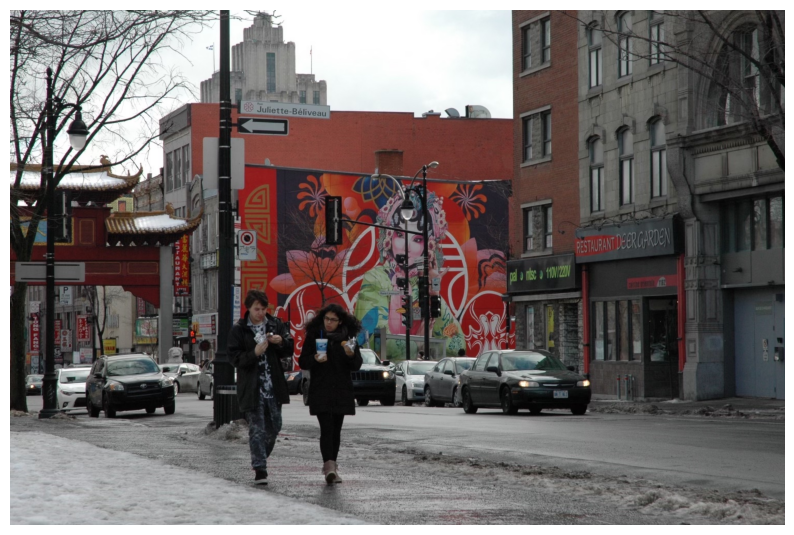

In [23]:
# Load and preprocess your image
image_street = cv2.imread(path + '/Street_Picture.jpg')

# Convert from BGR to RGB
image_street = cv2.cvtColor(image_street, cv2.COLOR_BGR2RGB)

# Use matplotlib to display the image
plt.figure(figsize=(10, 10))  # You can adjust the figure size as needed
plt.imshow(image_street)
plt.axis('off')  # This hides the axis ticks and labels
plt.show()

#### MaskR-CNN

[03/28 16:08:44 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl ...


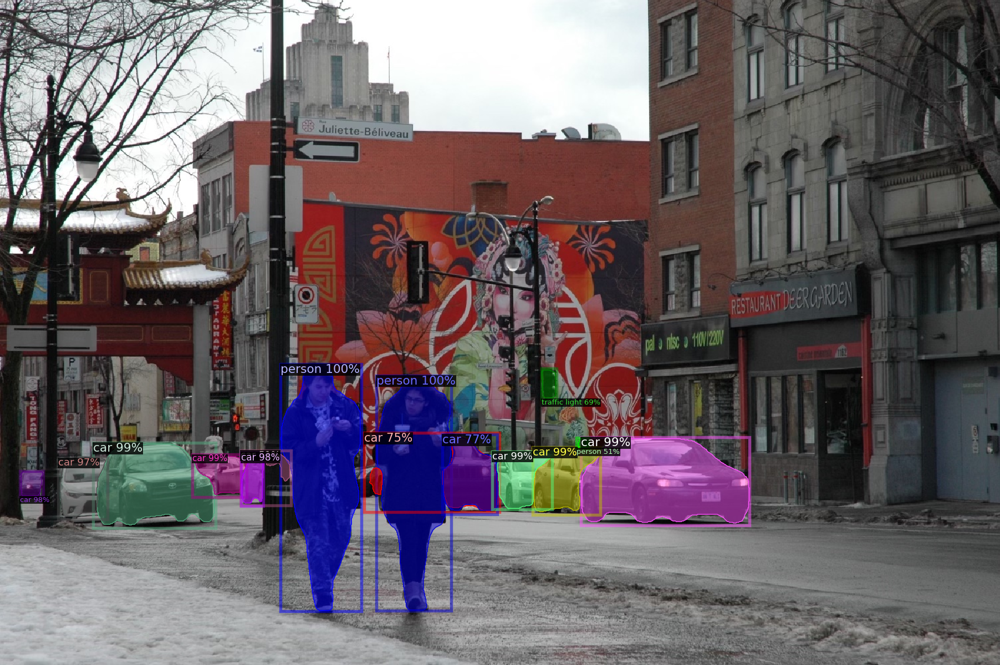

In [25]:
# Convert from BGR to RGB
image_street = cv2.cvtColor(image_street, cv2.COLOR_BGR2RGB)
process_image(image_street, cfg)

#### YOLOv8-seg


0: 448x640 2 persons, 10 cars, 13.6ms
Speed: 8.3ms preprocess, 13.6ms inference, 4.3ms postprocess per image at shape (1, 3, 448, 640)


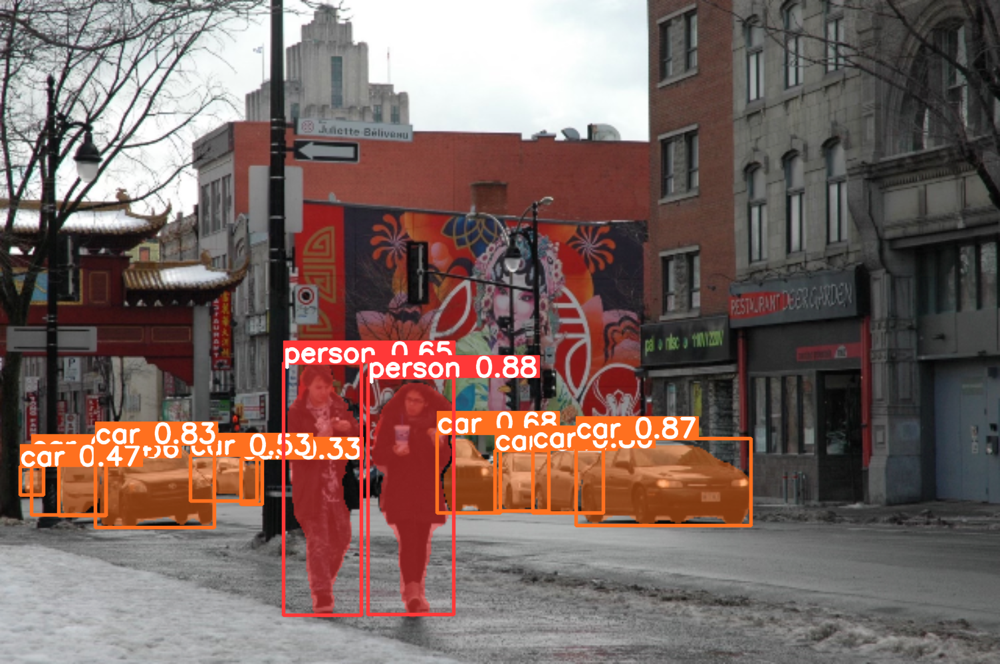

In [26]:
# Run the model
results = model(image_street)

for r in results:
    im_array = r.plot()  # plot a BGR numpy array of predictions
    img = Image.fromarray(im_array[..., ::-1])  # RGB PIL image
    img = cv2.cvtColor(im_array[..., ::-1], cv2.COLOR_BGR2RGB) # Open-CV reads images as BGR, we convert it to RGB
    cv2_imshow(img)

### 2.4 - Compare the performance of these two models

#### Mask R-CNN steps
1. **Backbone Network:** Extracts features from the image using a series of convolutional, pooling, and non-linear layers.
2. **Region Proposal Network (RPN):** Uses anchor boxes to propose potential object regions, scoring them based on "objectness."
3. **Feature Pyramid Network (FPN):** Creates a multi-scale representation of the image for detecting objects at different scales.
4. **Region of Interest (RoI) Align:** Precisely extracts features from proposed regions using bilinear interpolation, avoiding misalignments.
5. **Classification and Bounding Box Regression:** Classifies regions and refines bounding box positions and sizes.
6. **Mask Head and Mask Prediction:** Generates pixel-level masks for each detected object by predicting foreground/background for each pixel within the region.
7. **Training and Inference:** Utilizes a combination of classification loss, bounding box regression loss, and mask segmentation loss for training. During inference, it performs region proposals, classification, bounding box regression, and mask prediction to achieve instance segmentation.

Source: https://www.picsellia.com/post/mask-r-cnn-everything-explained

#### Comparison and Performance
* **Confidence Levels:** Mask R-CNN's structure, with its focus on both the bounding box and mask predictions, allows it to make more confident predictions, especially in scenarios requiring detailed segmentation. This might explain its higher confidence scores, particularly for detecting people with 100% confidence, where precise segmentation is crucial.

* **Detection of Small or Complex Objects:** Mask R-CNN’s ability to use high-resolution features effectively might have contributed to its detection of a traffic light, a relatively small and easily missed object, whereas YOLOv8n-seg did not detect it. This can be attributed to the FPN backbone and the dedicated mask branch of Mask R-CNN, which are adept at handling small or intricate objects.

* **Classification Confidence:** The confusion observed in YOLOv8n-seg between similar categories (e.g., car vs. truck or motorcycle) with low confidence might come from its holistic approach to detection, which, while fast, might struggle with similar or overlapping categories in complex scenes.

The differences in performance between Mask R-CNN and YOLOv8n-seg can be due to their underlying architectures and the specific focus of their design. Mask R-CNN prioritizes accuracy and detailed segmentation, whereas YOLO's *You Only Look Once* architecture is designed for speed and efficiency. The choice between them would depend on the specific requirements of the application, balancing the need for speed against the need for precision and high-confidence predictions.

Sources: [Source 1](https://www.researchgate.net/publication/376357696_Comparing_YOLOv8_and_Mask_RCNN_for_object_segmentation_in_complex_orchard_environments), [Source 2](https://roboflow.com/compare/yolos-vs-mask-rcnn)